<a href="https://colab.research.google.com/github/FaizalLeviansyah/PCVK_Ganjil_2023/blob/main/Group_7_PCVK_UAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **KTM Identity Group Project**

#**UAS FINAL PROJECT GROUP 7**
Member:
- **Faizal Leviansyah**
- **Raihan Dany Radhinuur**
### **3I-TI**
### **PCVK**

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import imutils
import zipfile
import re
import cv2
import random
import os
import subprocess

from PIL import Image
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from google.colab.patches import cv2_imshow
from tensorflow.keras.models import load_model
from imutils.contours import sort_contours

**CONNECT THE COLLAB WITH THE DRIVE**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# DATASET LOAD FROM KAGGLE A-Z

In [ ]:
!wget https://iaexpert.academy/arquivos/alfabeto_A-Z.zip

--2023-12-20 05:06:54--  https://iaexpert.academy/arquivos/alfabeto_A-Z.zip
Resolving iaexpert.academy (iaexpert.academy)... 162.159.134.42
Connecting to iaexpert.academy (iaexpert.academy)|162.159.134.42|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 193643888 (185M) [application/zip]
Saving to: ‘alfabeto_A-Z.zip’

alfabeto_A-Z.zip    100%[===================>] 184.67M   151MB/s    in 1.2s    

2023-12-20 05:06:56 (151 MB/s) - ‘alfabeto_A-Z.zip’ saved [193643888/193643888]



In [ ]:
# Extract zip file
zip_object = zipfile.ZipFile(file = 'alfabeto_A-Z.zip', mode = 'r')
zip_object.extractall('./')
zip_object.close()

In [ ]:
dataset_az = pd.read_csv('A_Z Handwritten Data.csv').astype('float32')
dataset_az

,0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,...,0.639,0.640,0.641,0.642,0.643,0.644,0.645,0.646,0.647,0.648
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372445,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372446,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372447,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
372448,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Get pixel data only
alphabet_data = dataset_az.drop('0', axis=1)
# Get labels only
alphabet_labels = dataset_az['0']

In [ ]:
# Check shape data
alphabet_data.shape, alphabet_labels.shape

((372450, 784), (372450,))

In [ ]:
# Check shape labels
alphabet_labels.shape

(372450,)

In [ ]:
# Reshape pixel data to 28*28
alphabet_data = np.reshape(alphabet_data.values, (alphabet_data.shape[0], 28, 28))
# Check the result by its shape
alphabet_data.shape

(372450, 28, 28)

Text(0.5, 1.0, 'Class: 7.0')

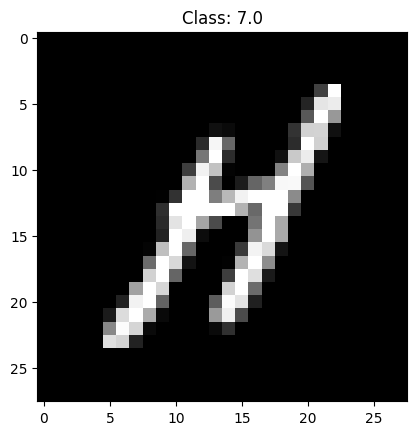

In [ ]:
# Randomly checking A-Z dataset
index = np.random.randint(0, alphabet_data.shape[0])
plt.imshow(alphabet_data[index], cmap = 'gray')
plt.title('Class: ' + str(alphabet_labels[index]))

<Axes: xlabel='Labels', ylabel='count'>

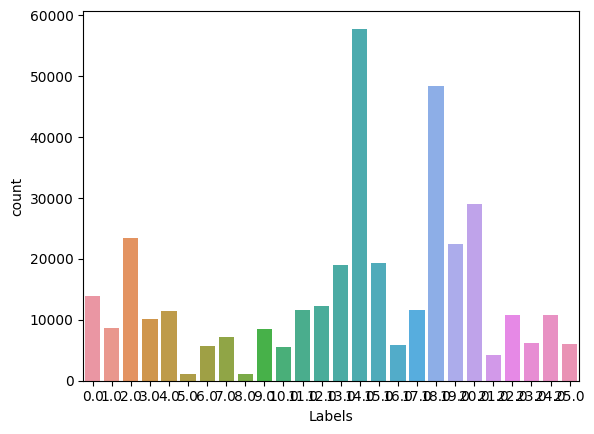

In [ ]:
# Check data distribution
df_az_labels = pd.DataFrame({
    'Labels': alphabet_labels.values
})
sns.countplot(df_az_labels, x='Labels')

<Axes: xlabel='Labels', ylabel='count'>

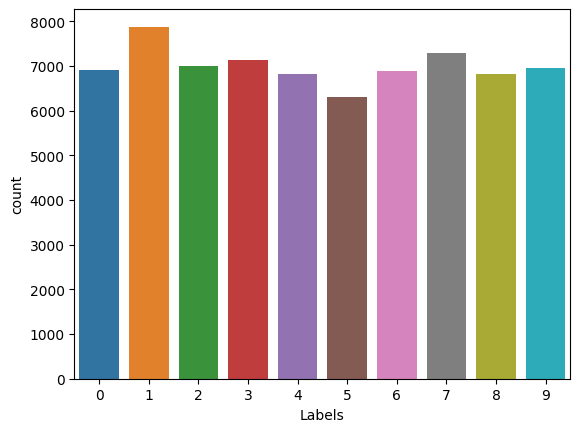

In [ ]:
# Check data distribution
df_labels = pd.DataFrame(digits_labels, columns=['Labels'])
sns.countplot(df_labels, x='Labels')

# **Model MNIST**
**LOAD MNIST DATASET**

In [ ]:
from tensorflow.keras.datasets import mnist

In [ ]:
(train_data, train_labels), (test_data, test_labels) = mnist.load_data()

11490434/11490434 [==============================] - 0s 0us/step


In [ ]:
# Check shape data
(train_data.shape, test_data.shape)

((60000, 28, 28), (10000, 28, 28))

In [ ]:
# Check shape labels
(train_labels.shape, test_labels.shape)

((60000,), (10000,))

In [ ]:
# Check each data shape --> should be 28*28
train_data[0].shape

(28, 28)

In [ ]:
# Check the label
train_labels.shape

(60000,)

# COMBINE TRAIN ALSO WITH THE TEST THE DATA

In [ ]:
digits_data = np.vstack([train_data, test_data])
digits_labels = np.hstack([train_labels, test_labels])

In [ ]:
# Check data shape
digits_data.shape

(70000, 28, 28)

In [ ]:
# Check label shape
digits_labels.shape

(70000,)

Text(0.5, 1.0, 'Class: 9')

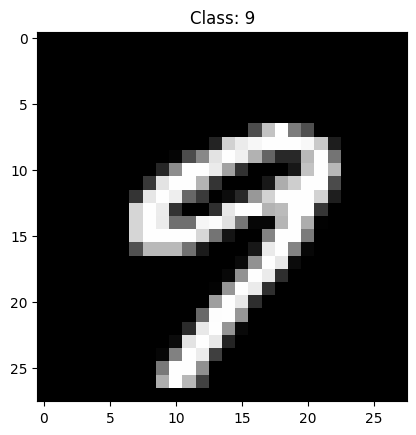

In [ ]:
# Randomly checking the data
idx = np.random.randint(0, digits_data.shape[0])
plt.imshow(digits_data[idx], cmap='gray')
plt.title('Class: ' + str(digits_labels[idx]))

# COMBINE THE DATASET BETWEEN MNIST + KAGGLE A-Z

In [ ]:
# Check unique value from digits_labels
np.unique(digits_labels)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=uint8)

In [ ]:
# Check unique value from alphabet_labels
np.unique(alphabet_labels)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.],
      dtype=float32)

In [ ]:
# We already know that digits labels containt labels from 0-9 (10 labels)
# We also know that alphabet labels start from 0-25 which represent A-Z
# If we want to combine them, the A-Z labels should continuing the digits label

alphabet_labels += 10

In [ ]:
# check alphabet labels again
np.unique(alphabet_labels)

array([10., 11., 12., 13., 14., 15., 16., 17., 18., 19., 20., 21., 22.,
       23., 24., 25., 26., 27., 28., 29., 30., 31., 32., 33., 34., 35.],
      dtype=float32)

In [ ]:
# Combine both of them
data = np.vstack([alphabet_data, digits_data])
labels = np.hstack([alphabet_labels, digits_labels])

In [ ]:
# Check the shape
data.shape, labels.shape

((442450, 28, 28), (442450,))

In [ ]:
# Check labels
np.unique(labels)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35.], dtype=float32)

In [ ]:
# Convert data to float32
data = np.array(data, dtype = 'float32')

In [ ]:
# Since Convolutional need 3d data (including depth)
# and our images only in 2d data (because in grayscale format)
# we need to add "the depth" to the data
data = np.expand_dims(data, axis=-1)

# check shape
data.shape

(442450, 28, 28, 1)

# PREPROCESSING IMAGE PROCESS

**NORMALIZE**

In [ ]:
# Normalize data
data /= 255.0

In [ ]:
# Check range value of data
data[0].min(), data[0].max()

(0.0, 1.0)

In [ ]:
# Enconde the labels
# LabelBinarizer similar with OneHotEncoder
le = LabelBinarizer()
labels = le.fit_transform(labels)

In [ ]:
# Check labels shape
labels.shape

(442450, 36)

Text(0.5, 1.0, '[0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]')

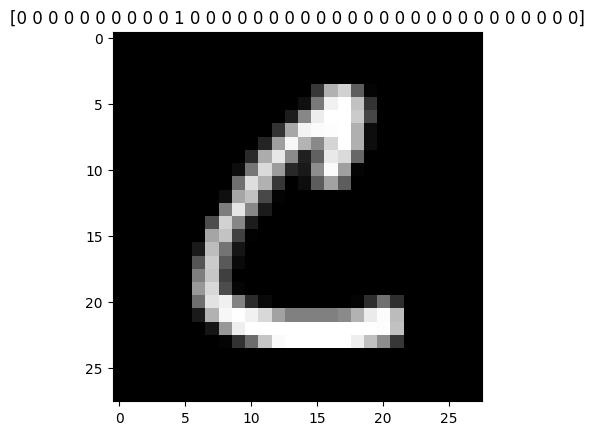

In [ ]:
# Check data with label binarizer's label
plt.imshow(data[30000].reshape(28,28), cmap='gray')
plt.title(str(labels[0]))

In [ ]:
# Since our data is not balance, we will handle it by giving weight for 'small' data

# Check number of data for each labels first
classes_total = labels.sum(axis = 0)
classes_total

array([ 6903,  7877,  6990,  7141,  6824,  6313,  6876,  7293,  6825,
        6958, 13869,  8668, 23409, 10134, 11440,  1163,  5762,  7218,
        1120,  8493,  5603, 11586, 12336, 19010, 57825, 19341,  5812,
       11566, 48419, 22495, 29008,  4182, 10784,  6272, 10859,  6076])

In [ ]:
# Check the biggest value of data
classes_total.max()

57825

In [ ]:
# Create a weight for each data
classes_weights = {}
for i in range(0, len(classes_total)):
  #print(i)
  classes_weights[i] = classes_total.max() / classes_total[i]

# Check the weight for each data
classes_weights

{0: 8.376792698826597,
 1: 7.340992763742541,
 2: 8.272532188841202,
 3: 8.097605377398123,
 4: 8.473769050410317,
 5: 9.15967052114684,
 6: 8.409685863874346,
 7: 7.928835870012341,
 8: 8.472527472527473,
 9: 8.310577752227651,
 10: 4.169370538611291,
 11: 6.671089063221043,
 12: 2.4702037677816224,
 13: 5.7060390763765545,
 14: 5.0546328671328675,
 15: 49.72055030094583,
 16: 10.035577924331829,
 17: 8.011221945137157,
 18: 51.629464285714285,
 19: 6.808548216178029,
 20: 10.320364090665715,
 21: 4.990937338166753,
 22: 4.6875,
 23: 3.0418200946870066,
 24: 1.0,
 25: 2.989762680316426,
 26: 9.94924294562973,
 27: 4.999567698426422,
 28: 1.1942625828703608,
 29: 2.5705712380529007,
 30: 1.993415609487038,
 31: 13.827116212338593,
 32: 5.362110534124629,
 33: 9.21954719387755,
 34: 5.3250759738465785,
 35: 9.51695194206715}

# DATA TO TRAIN & TEST CLASSIFICATION

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size = 0.2, random_state = 1, stratify = labels)

**MAKE DATA AUGMENTATION**

In [ ]:
# Import library
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
augmentation = ImageDataGenerator(rotation_range = 10, zoom_range=0.05, width_shift_range=0.1,
                                  height_shift_range=0.1, horizontal_flip = False)

**MAKE MODEL CNN**

In [ ]:
# Import library
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Flatten, Dense
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
# Build the network
network = Sequential()

network.add(Conv2D(filters = 32, kernel_size=(3,3), activation='relu', input_shape=(28,28,1)))
network.add(MaxPool2D(pool_size=(2,2)))

network.add(Conv2D(filters = 64, kernel_size=(3,3), activation='relu', padding='same'))
network.add(MaxPool2D(pool_size=(2,2)))

network.add(Conv2D(filters = 128, kernel_size=(3,3), activation='relu', padding='valid'))
network.add(MaxPool2D(pool_size=(2,2)))

network.add(Flatten())

network.add(Dense(64, activation = 'relu'))
network.add(Dense(128, activation = 'relu'))

# output
network.add(Dense(36, activation='softmax'))

network.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

In [ ]:
# Check network summary
network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

In [ ]:
# Create actual labels
name_labels = '0123456789'
name_labels += 'ABCDEFGHIJKLMNOPQRSTUVWXYZ'
name_labels = [l for l in name_labels]

# Check actual label
print(name_labels)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
import joblib

joblib.dump(name_labels, "labels.pkl")

['labels.pkl']

In [ ]:
a = joblib.load("labels.pkl")
print(a)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


**TRAIN MODEL**

In [ ]:
# # Set model name, epoch, and batch size
# file_model = 'custom_ocr.model'
# epochs = 10
# batch_size = 128

In [ ]:
# # Setup checkpoint
# checkpointer = ModelCheckpoint(file_model, monitor = 'val_loss', verbose = 1, save_best_only=True)

In [ ]:
# # Fit the model
# history = network.fit(augmentation.flow(X_train, y_train, batch_size=batch_size),
#                       validation_data = (X_test, y_test),
#                       steps_per_epoch = len(X_train) // batch_size, epochs=epochs,
#                       class_weight = classes_weights, verbose=1, callbacks=[checkpointer])

# SAVE ALSO LOAD THE MODEL

In [ ]:
# # The result will show in colab directory
# save_path ='/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/baru dari rehan/model_baru/model.h5'
# network.save(save_path)

In [ ]:
# save_path = '/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/baru dari rehan/model_baru/model.h5'
# load_network = load_model(save_path)

# EVALUATING THE MODEL TO MAKE SINGLE PREDICTION


In [ ]:
# # make a prediction
predictions = load_network.predict(X_test, batch_size=batch_size)

692/692 [==============================] - 1s 2ms/step


In [ ]:
# # Check prediction for data-0
# # You will get the probability for each label
# # The highest one is the prediction
predictions[10]

array([6.2508953e-08, 8.9211611e-08, 1.7688124e-07, 1.1745506e-05,
       1.8964003e-10, 9.5943557e-03, 6.5264292e-05, 6.1738727e-13,
       3.7678423e-05, 3.3688350e-05, 3.8662185e-12, 5.1627666e-07,
       8.9629953e-07, 2.5113630e-07, 3.8828985e-06, 2.9251691e-11,
       3.9928567e-04, 1.2534495e-09, 3.7380580e-12, 1.3744667e-06,
       8.8745788e-11, 6.9722866e-08, 3.4520652e-12, 8.9257188e-09,
       4.7091024e-07, 1.1365653e-08, 1.2747005e-06, 9.1066278e-12,
       9.8984891e-01, 2.7408784e-09, 5.7261527e-08, 7.6097469e-11,
       1.1376238e-08, 4.1039149e-14, 2.5606826e-09, 1.5738287e-08],
      dtype=float32)

In [ ]:
# Get the actual prediction -> highest probability
np.argmax(predictions[10])

28

In [ ]:
# Check label for 24
name_labels[28]

'S'

In [ ]:
# Check y_test label for 0
y_test[10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
# check the highest value
np.argmax(y_test[10])

28

In [ ]:
# Check the label of y_test 0
name_labels[np.argmax(y_test[10])]

'S'


# EVALUATING MODEL TO MAKE AN EVALUATION ON TEST DATA

In [ ]:
# Evaluate on test data
load_network.evaluate(X_test, y_test)

2766/2766 [==============================] - 9s 3ms/step - loss: 0.1896 - accuracy: 0.9250


[0.1895773708820343, 0.9250310659408569]

In [ ]:
# Print Classification Report
print(classification_report(y_test.argmax(axis=1), predictions.argmax(axis=1), target_names = name_labels))

              precision    recall  f1-score   support

           0       0.25      0.86      0.39      1381
           1       0.97      0.99      0.98      1575
           2       0.86      0.99      0.92      1398
           3       0.98      0.98      0.98      1428
           4       0.78      0.99      0.87      1365
           5       0.66      0.93      0.77      1263
           6       0.88      0.99      0.93      1375
           7       0.94      1.00      0.97      1459
           8       0.81      0.99      0.89      1365
           9       0.94      0.99      0.96      1392
           A       0.99      0.99      0.99      2774
           B       0.99      0.96      0.98      1734
           C       0.99      0.98      0.98      4682
           D       0.93      0.96      0.95      2027
           E       0.99      0.98      0.98      2288
           F       0.81      1.00      0.90       233
           G       0.90      0.97      0.93      1152
           H       0.97    

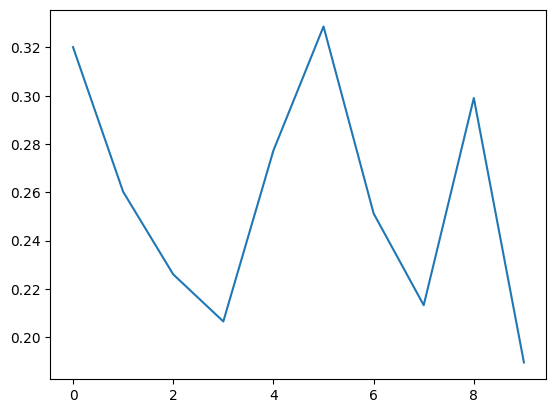

In [ ]:
# Visualize loss value for each epoch
plt.plot(history.history['val_loss'])

In [ ]:
# You can also check the another metrics
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

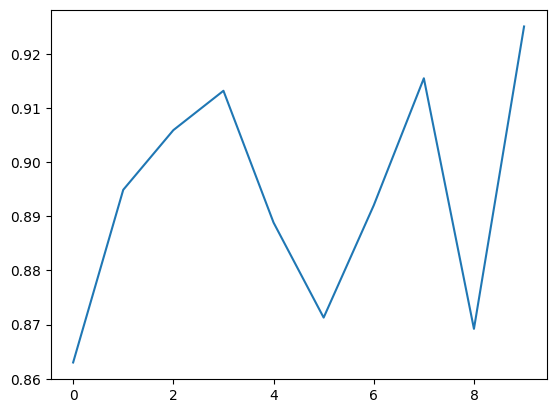

In [ ]:
# Check the model performance by validation accuracy
plt.plot(history.history['val_accuracy'])

# TESTING IT ON THE REAL IMAGE

In [ ]:
# Import library
from tensorflow.keras.models import load_model

In [ ]:
save_path = '/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/baru dari rehan/model_baru/network.h5'
load_network = load_model(save_path)

In [ ]:
# Check summary
load_network.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 13, 13, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 13, 13, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 6, 6, 64)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 4, 4, 128)         73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 128)         0

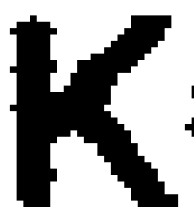

In [ ]:
# Load Image
import cv2
from google.colab.patches import cv2_imshow

img = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/baru dari rehan/K besar.png')
cv2_imshow(img)

In [ ]:
# Check shape
img.shape

(224, 194, 3)

In [ ]:
# Convert to gray
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# check shape
gray_img.shape

(224, 194)

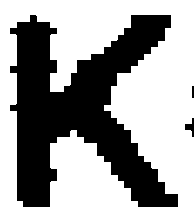

112.0


In [ ]:
# Pre-process
# Binary Threshold and Otsu
value, thresh = cv2.threshold(gray_img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

cv2_imshow(thresh)

# print threshold value
print(value)

In [ ]:
# Resize image in order to match network input shape -> 28*28
img_resize = cv2.resize(gray_img, (28,28))
cv2_imshow(img_resize)

**RESIZE**

In [ ]:
img_resize.shape

(28, 28)

In [ ]:
# Convert to float 32
# and extend the dimension since network input shape is 28*28*1
img_input = img_resize.astype('float32') / 255 # also perform normalization
img_input = np.expand_dims(img_input, axis=-1) # insert depth

# check shape
img_input.shape

(28, 28, 1)

In [ ]:
# Add "amount of data" as dimension
img_input = np.reshape(img_input, (1,28,28,1))
img_input.shape

(1, 28, 28, 1)

In [ ]:
# Make a predition
prediction = load_network.predict(img_input)
pred_label = np.argmax(prediction) # predict actual label
pred_label

1/1 [==============================] - 0s 254ms/step


2

In [ ]:
# check label for 6
name_labels[11]

'B'

# **CHARACTER RECOGNITION**

In [ ]:
#img  = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3B_2141720100_4 - adinda kurnia rifanti.jpg')

# show image
#cv2_imshow(img)

**CROP IMAGE**

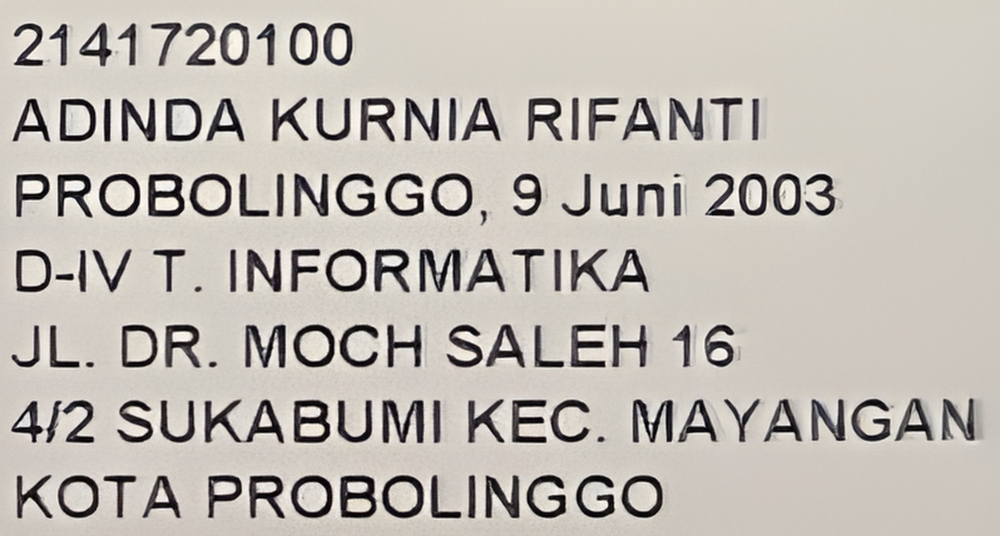

In [ ]:

img = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/FotoCropHD/2b68689b-628e-4662-92af-1cc2189651b1.jpg')

# show image
cv2_imshow(img)


**CONVERTING TO GRAY PROCESS**

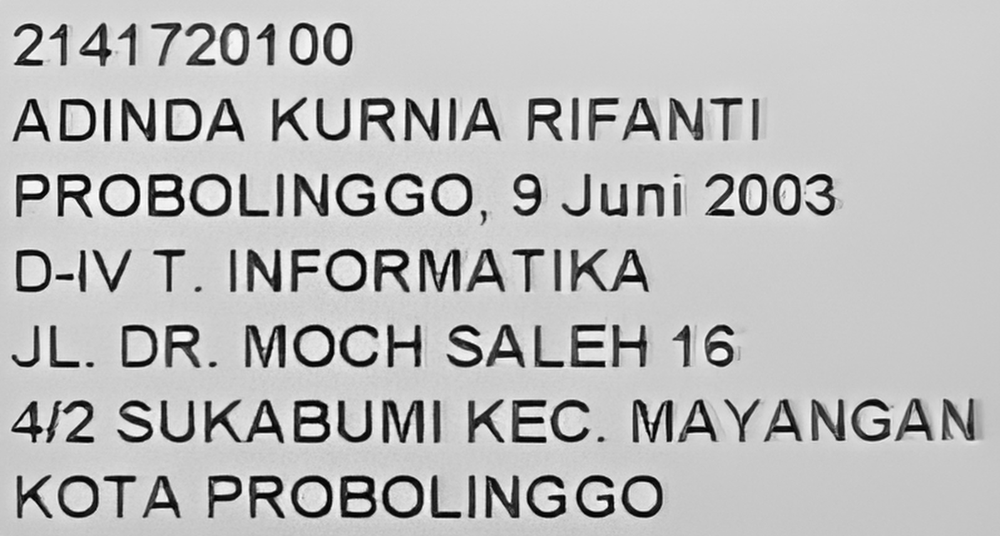

In [ ]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# show
cv2_imshow(gray)

**REMOVE THE NOISE WITH THE GAUSSIAN BLUR**

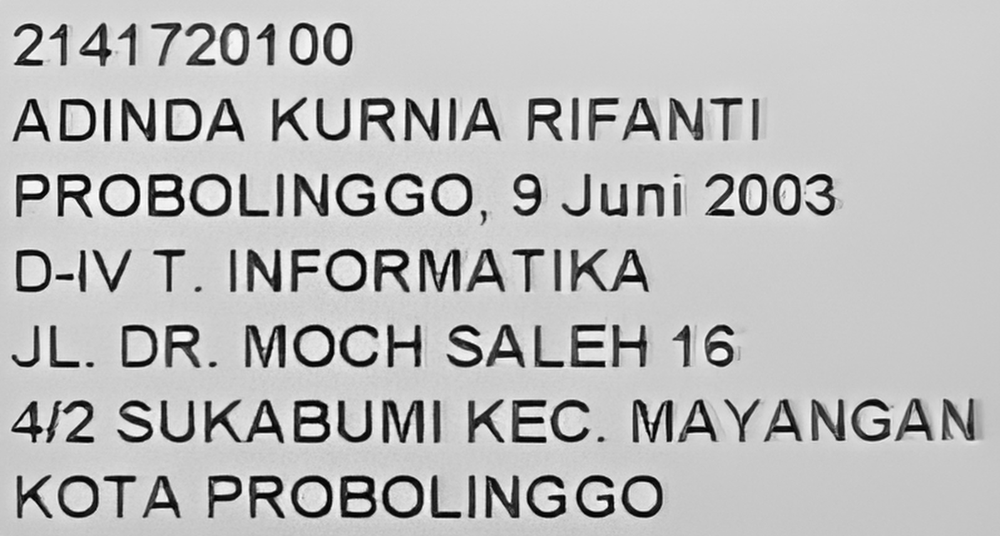

In [ ]:
blur = cv2.GaussianBlur(gray, (1,1), 0)
# check
cv2_imshow(blur)

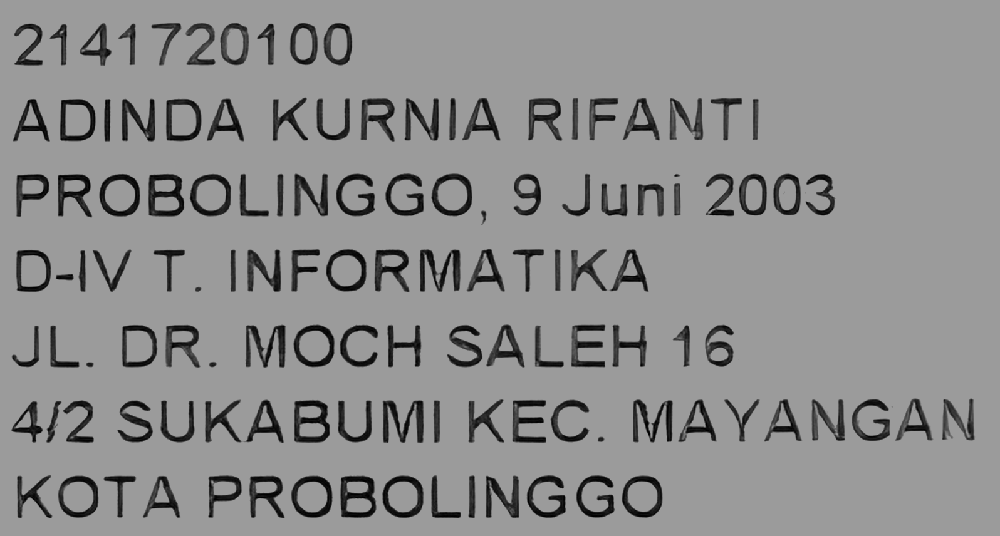

In [ ]:
# Lakukan thresholding pada citra yang telah di-blur
ret, thresh_rafi = cv2.threshold(blur.copy(), 155, 255, cv2.THRESH_TRUNC)

cv2_imshow(thresh_rafi)

**ADAPTIVE THRESHOLDING**

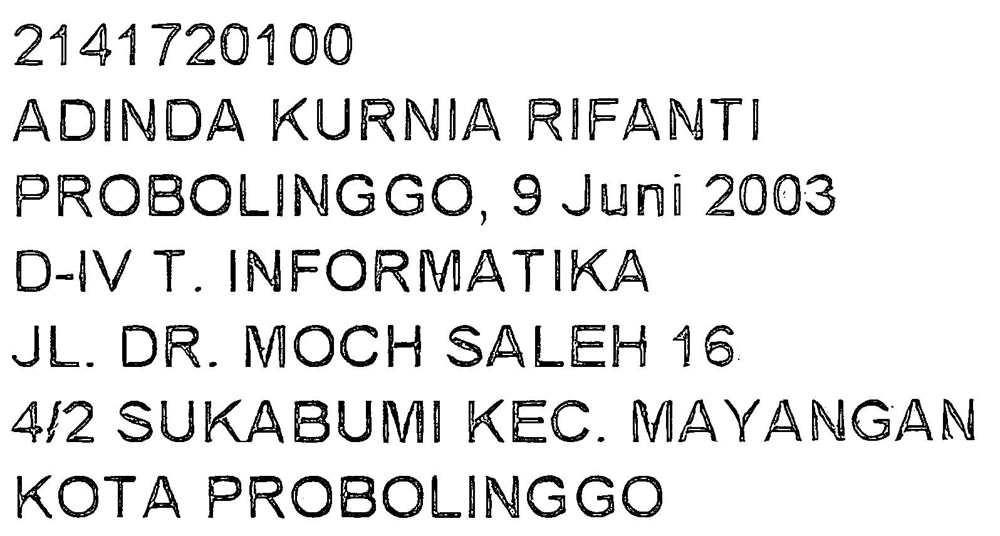

In [ ]:
adaptive = cv2.adaptiveThreshold(thresh_rafi, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 1)
# check
cv2_imshow(adaptive)

# Write the adaptive thresholded image to a file
#cv2.imwrite('/content/drive/MyDrive/PCVK/UAS/crop_image/muti5_thresh.jpg', adaptive)

**INVERTION**

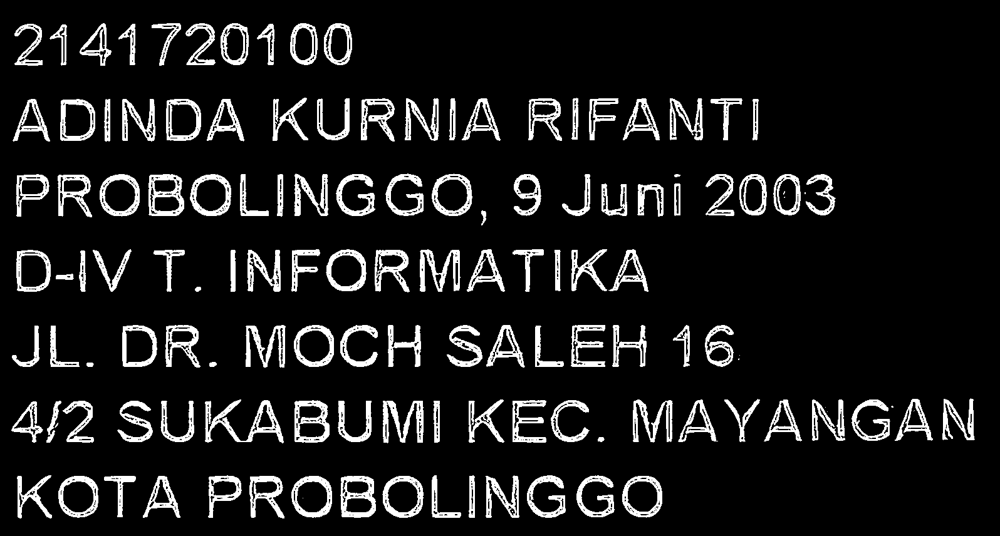

In [ ]:
# inverse image since we trained out model
# with black background
invertion = 255 - adaptive
# check
cv2_imshow(invertion)

**DILATION**

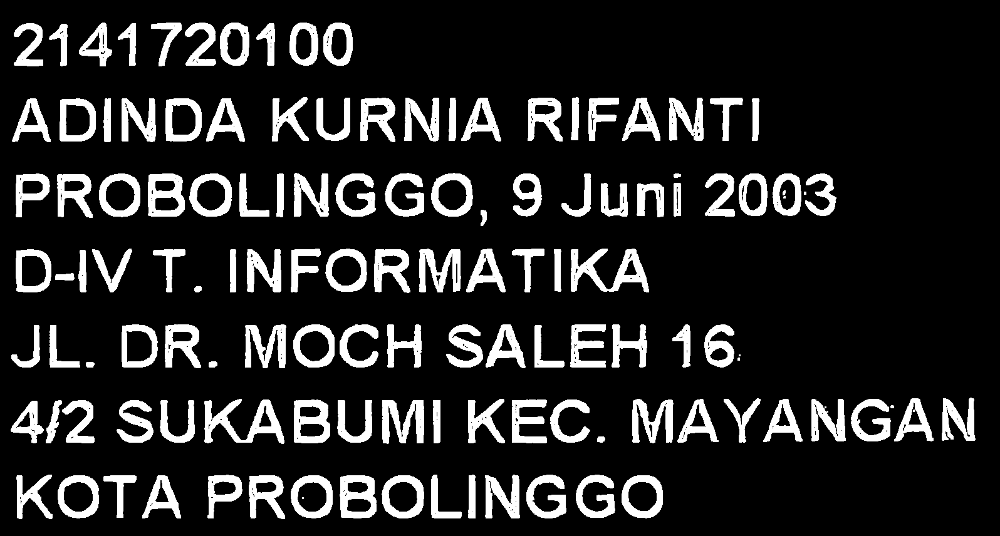

In [ ]:
dilation = cv2.dilate(invertion, np.ones((3,3)))
# check
cv2_imshow(dilation)

**EDGE DETECTION**

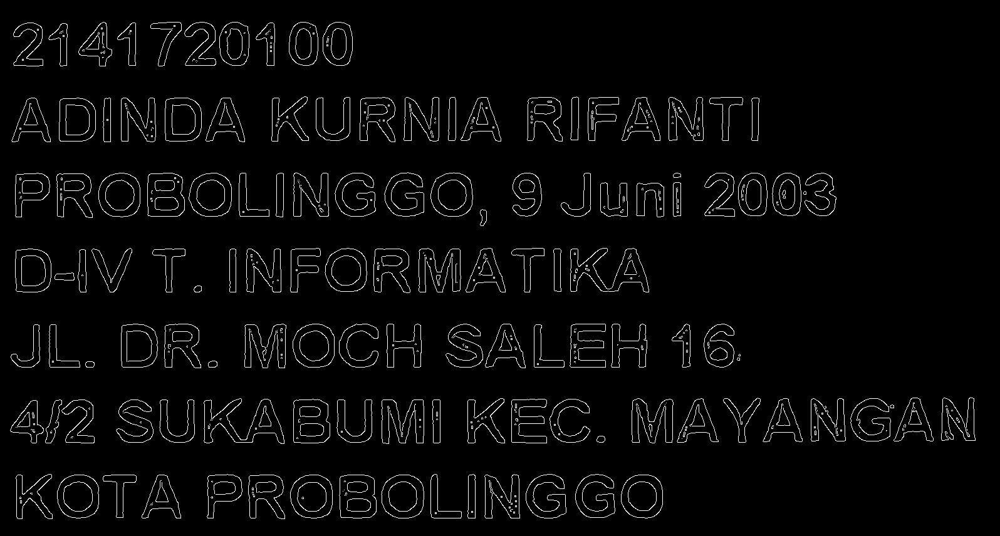

In [ ]:
edges = cv2.Canny(dilation, 40, 150)
cv2_imshow(edges)

**ERODE**

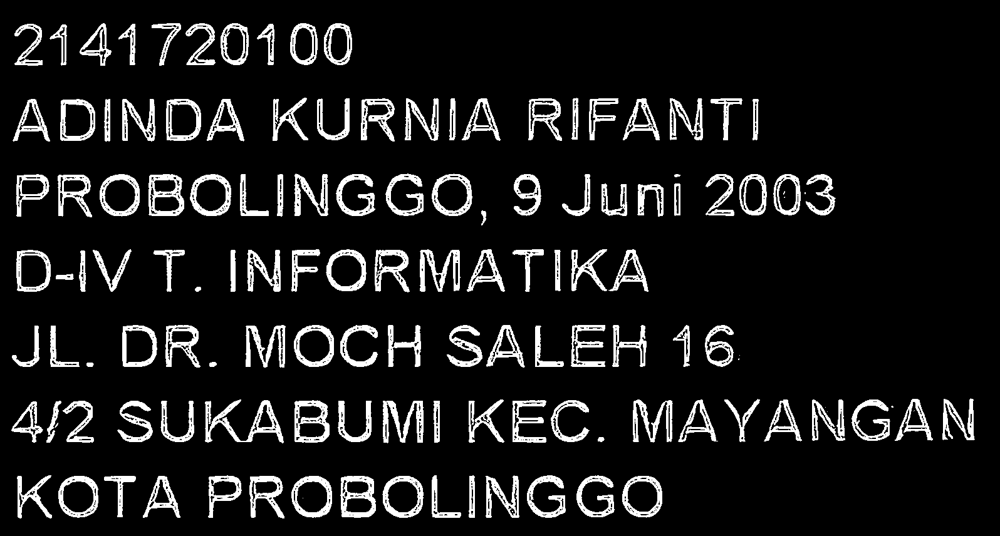

In [ ]:
# Test erode
erode = cv2.erode(invertion, np.ones((1,1)))
cv2_imshow(erode)

**PRE-PROCESSING - CONTOUR DETECTION**

In [ ]:
# Define function for contour detection
def find_contours(img):
  conts = cv2.findContours(img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  conts = imutils.grab_contours(conts)
  conts = sort_contours(conts, method='left-to-right')[0]

  return conts

In [ ]:
conts = find_contours(erode.copy())

In [ ]:
len(conts)

129

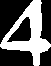

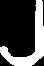

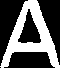

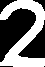

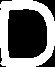

...

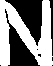

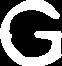

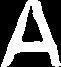

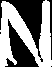

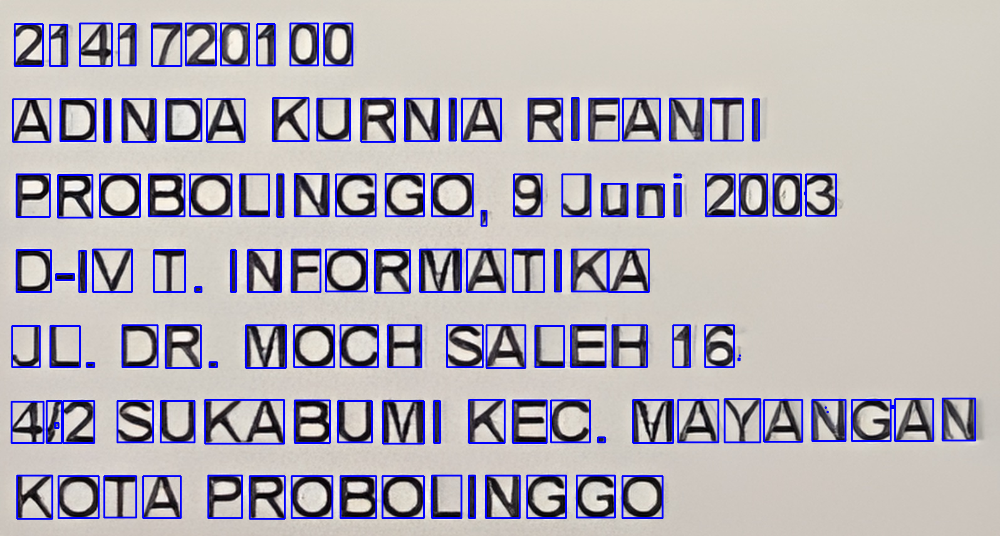

In [ ]:
# Get the char based on contour

# Setup min/max width/hight for char
min_w, max_w = 10, 160
min_h, max_h = 14, 140
img_copy = img.copy() # original image for plotting countour result

for c in conts:
  (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
  # if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
  roi = gray[y:y+h, x:x+w] # get region of interest for char
  thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  cv2_imshow(thresh) # check

  # Build bounding box on original image
  cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)

# Show bounding box on original image
cv2_imshow(img_copy)

**ROI EXTRACTION**

In [ ]:
def extract_roi(img):
  roi = img[y:y+h, x:x+w]

  return roi

# Thresholding
def thresholding(img):
  thresh = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  return thresh

# Resizing
def resize_img(img, w, h):
  if w > h:
    resized = imutils.resize(img, width=28)
  else:
    resized = imutils.resize(img, height=28)

  # (w, h) = resized.shape
  (h, w) = resized.shape

  # Calculate how many pixels need to fill char image
  dX = int(max(0, 28 - w) / 2.0)
  dY = int(max(0, 28 - h) / 2.0)

  filled = cv2.copyMakeBorder(resized, top=dY, bottom=dY, right=dX, left=dX, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))
  filled = cv2.resize(filled, (28,28))

  return filled

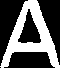

In [ ]:
# Demo for enlarge
(x, y, w, h) = cv2.boundingRect(conts[2])
test_image = thresholding(gray[y:y+h, x:x+w])

# show original test image
cv2_imshow(test_image)

# Show enlarge test image
cv2_imshow(cv2.resize(test_image, (28,28)))

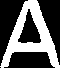

In [ ]:
# Demo by filled strategy
# (w, h) = test_image.shape
(h, w) = test_image.shape

test_image2 = resize_img(test_image, w, h)

cv2_imshow(test_image)
cv2_imshow(test_image2)

**NORMALIZATION**

In [ ]:
def normalization(img):
  img = img.astype('float32') / 255.0 # convert to floating point
  img = np.expand_dims(img, axis=-1) # add depth
  return img

In [ ]:
# Check
test_image2.shape, normalization(test_image2).shape

((28, 28), (28, 28, 1))

**DETECTION**

In [ ]:
def process_box(gray, x, y, w, h):

  roi = extract_roi(gray)
  thresh = thresholding(roi)
  (h, w) = thresh.shape
  resized = resize_img(thresh, w, h)

  # show result
  cv2_imshow(resized)

  normalized = normalization(resized)

  return (normalized, (x, y, w, h))

In [ ]:
# Detect every single char from contour
detected_char = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 2, 20
  min_h, max_h = 10, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char.append(process_box(gray, x, y, w, h))

# Detect every single char from contour
detected_char2 = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 20, 160
  min_h, max_h = 10, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char2.append(process_box(gray, x, y, w, h))

In [ ]:
detected_char[0][0]

detected_char2[0][0]

array([[[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.01568628],
        [0.29803923],
        [0.79607844],
        [1.        ],
        [0.96862745],
        [0.67058825],
        [0.03137255],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ]],

       [[0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.        ],
        [0.23921569],
        [0.7254902 ],
        

In [ ]:
# check bounding box for detected char sample
detected_char[0][1]
detected_char2[0][1]


(18, 641, 51, 66)

In [ ]:
# Get all char pixel
pixels = np.array([px[0] for px in detected_char], dtype='float32')

# Get all box for detected char
boxes = [box[1] for box in detected_char]

# Get all char pixel
pixels2 = np.array([px[0] for px in detected_char2], dtype='float32')

# Get all box for detected char
boxes2 = [box[1] for box in detected_char2]

In [ ]:
pixels.shape
pixels2.shape

(105, 28, 28, 1)

**RECOGNIZE CHARACTER**

In [ ]:
digits = '0123456789'
letters = 'ABCDEFGHIJKLMNOPQRSTUVWZYZ'
char_list = digits + letters
char_list = [ch for ch in char_list]

print(char_list)

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'Z', 'Y', 'Z']


In [ ]:
save_path = '/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/baru dari rehan/model_baru/network.h5'
load_network = load_model(save_path)

In [ ]:
# Predict
preds = load_network.predict(pixels)

preds2 = load_network.predict(pixels2)

4/4 [==============================] - 0s 9ms/step


In [ ]:
# Char Prediction
for p in preds:
  char_idx = np.argmax(p)
  print(char_list[char_idx], end = " ")

# Char Prediction
for p in preds2:
  char_idx = np.argmax(p)
  print(char_list[char_idx], end = " ")

1 1 1 1 1 1 1 Y 1 1 1 1 4 J A 2 D P K 1 7 L 0 R O D 2 4 V O T S 1 D N A B T T U R D 2 O M A P 0 L N N R 3 K O O F O B N U 0 O G U B C R A O N G H N M L 0 S A A K N A F T 9 G R L C J F K G F U A H O A M T N 1 A G 2 T V O A O 3 N G A N 

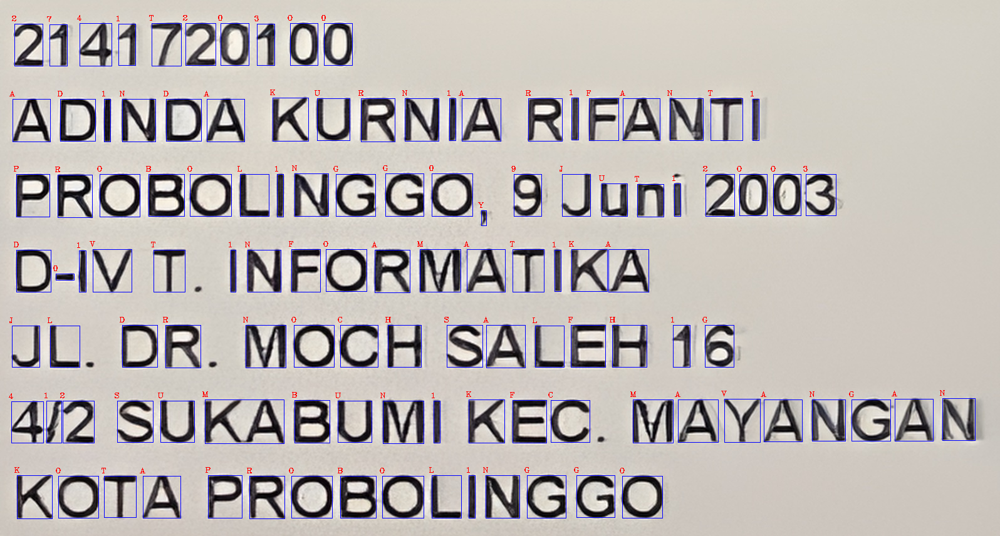

In [ ]:
# Show char with actual image
img_copy2 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/FotoCropHD/2b68689b-628e-4662-92af-1cc2189651b1.jpg')

for(pred, (x, y, w, h)) in zip(preds, boxes):
  i = np.argmax(pred)
  char_detected = char_list[i]

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 1)
  cv2.putText(img_copy2, char_detected, (x - 5, y - 5), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0,0,255), 1)

for(pred2, (x, y, w, h)) in zip(preds2, boxes2):
  i = np.argmax(pred2)
  char_detected2 = char_list[i]

  cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 1)
  cv2.putText(img_copy2, char_detected2, (x - 5, y - 5), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0,0,255), 1)


cv2_imshow(img_copy2)

In [ ]:
detected_char2 = []

for c in conts:
  (x, y, w, h ) = cv2.boundingRect(c)

  min_w, max_w = 20, 160
  min_h, max_h = 10, 140

  if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h):
    detected_char2.append(process_box(gray, x, y, w, h))

# **DRIVE IMAGE TEST**

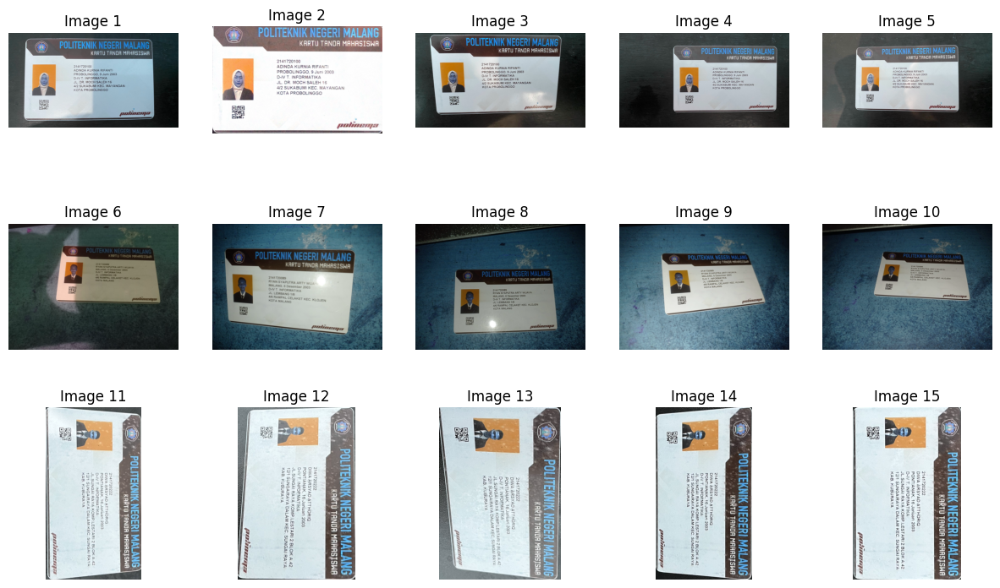

In [ ]:
imgadn1 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3B_2141720100_1 - adinda kurnia rifanti.jpg')
imgadn1_rgb = cv2.cvtColor(imgadn1, cv2.COLOR_BGR2RGB)
imgadn2 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3B_2141720100_2 - Adinda Kurnia Rifanti.jpg')
imgadn2_rgb = cv2.cvtColor(imgadn2, cv2.COLOR_BGR2RGB)
imgadn3 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3B_2141720100_3 - adinda kurnia rifanti.jpg')
imgadn3_rgb = cv2.cvtColor(imgadn3, cv2.COLOR_BGR2RGB)
imgadn4 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3B_2141720100_4 - adinda kurnia rifanti.jpg')
imgadn4_rgb = cv2.cvtColor(imgadn4, cv2.COLOR_BGR2RGB)
imgadn5 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3B_2141720100_5 - adinda kurnia rifanti.jpg')
imgadn5_rgb = cv2.cvtColor(imgadn5, cv2.COLOR_BGR2RGB)

imgrya1 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720089_1 - RYAN SYAPUTRA ARTY WIJAYA.jpeg')
imgrya1_rgb = cv2.cvtColor(imgrya1, cv2.COLOR_BGR2RGB)
imgrya2 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720089_2 - RYAN SYAPUTRA ARTY WIJAYA.jpeg')
imgrya2_rgb = cv2.cvtColor(imgrya2, cv2.COLOR_BGR2RGB)
imgrya3 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720089_3 - RYAN SYAPUTRA ARTY WIJAYA.jpeg')
imgrya3_rgb = cv2.cvtColor(imgrya3, cv2.COLOR_BGR2RGB)
imgrya4 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720089_4 - RYAN SYAPUTRA ARTY WIJAYA.jpeg')
imgrya4_rgb = cv2.cvtColor(imgrya4, cv2.COLOR_BGR2RGB)
imgrya5 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720089_5 - RYAN SYAPUTRA ARTY WIJAYA.jpeg')
imgrya5_rgb = cv2.cvtColor(imgrya5, cv2.COLOR_BGR2RGB)

imgdiw1 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720222_1_-_Diwa_Oliq.jpg')
imgdiw1_rgb = cv2.cvtColor(imgdiw1, cv2.COLOR_BGR2RGB)
imgdiw2 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720222_2_-_Diwa_Oliq.jpg')
imgdiw2_rgb = cv2.cvtColor(imgdiw2, cv2.COLOR_BGR2RGB)
imgdiw3 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720222_3_-_Diwa_Oliq.jpg')
imgdiw3_rgb = cv2.cvtColor(imgdiw3, cv2.COLOR_BGR2RGB)
imgdiw4 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720222_4_-_Diwa_Oliq.jpg')
imgdiw4_rgb = cv2.cvtColor(imgdiw4, cv2.COLOR_BGR2RGB)
imgdiw5 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/foto_group4/3C_2141720222_5_-_Diwa_Oliq.jpg')
imgdiw5_rgb = cv2.cvtColor(imgdiw5, cv2.COLOR_BGR2RGB)

KTM = [imgadn1, imgadn2, imgadn3, imgadn4, imgadn5
       ,imgrya1, imgrya2, imgrya3, imgrya4, imgrya5,
       imgdiw1, imgdiw2, imgdiw3, imgdiw4, imgdiw5
       ]

KTM_rgb = [imgadn1_rgb, imgadn2_rgb, imgadn3_rgb, imgadn4_rgb, imgadn5_rgb
       ,imgrya1_rgb, imgrya2_rgb, imgrya3_rgb, imgrya4_rgb, imgrya5_rgb,
       imgdiw1_rgb, imgdiw2_rgb, imgdiw3_rgb, imgdiw4_rgb, imgdiw5_rgb
       ]


# Set up a figure with subplots
fig, axs = plt.subplots(nrows=3, ncols=5, figsize=(15, 9))

# Flatten the 2D array of subplots into a 1D array
axs = axs.flatten()

# # Iterate through the images and display them
# for i, img in enumerate(KTM):
#     axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#     axs[i].axis('off')  # Turn off axis labels
#     axs[i].set_title(f'Image {i+1}')

# plt.show()

# Iterate through the images and display them
for i, img in enumerate(KTM_rgb):
    axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')  # Turn off axis labels
    axs[i].set_title(f'Image {i+1}')

plt.show()

Image Test ADINDA

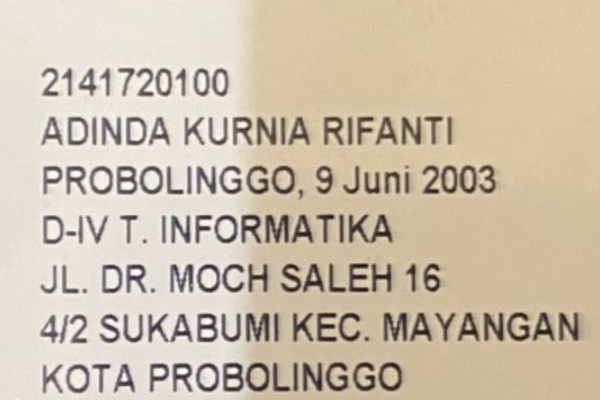

In [ ]:
# Assuming ktm_rgb_miko1 is your original image
new_width, new_height = 1800, 1200

# Resize the image with the new width and height
resized_img_ktm1 = cv2.resize(imgadn1, (new_width, new_height))

# Crop the resized image to the specified region
resized_and_cropped_img = resized_img_ktm1[350:750, 650:1250]

# Path to save the image
save_path_crop = '/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/FotoCropHD'

# Ensure the save directory exists

# Save the image
cv2.imwrite(os.path.join(save_path_crop, 'ktm_crop_adn1.png'), resized_and_cropped_img)

# Show the saved image
cv2_imshow(resized_and_cropped_img)

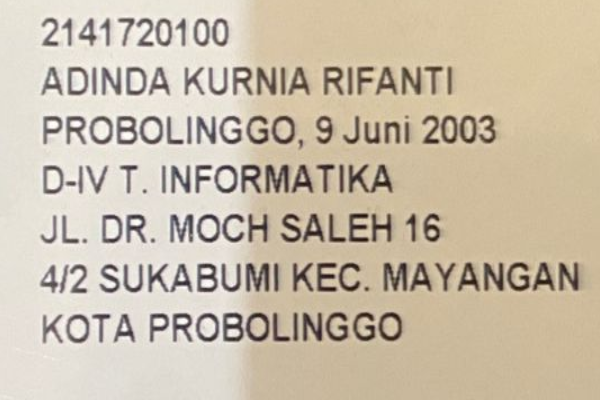

True

In [ ]:
resized_imgadn1 = cv2.resize(imgadn1, (new_width, new_height))
resized_imgktm1 = resized_imgadn1[400:800, 650:1250]
# show image
cv2_imshow(resized_imgktm1)

# Save the image
cv2.imwrite(os.path.join(save_path_crop, 'ktm_crop_adn1.png'), resized_imgktm1)

In [ ]:
def predict(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (1,1), 0)
  ret, thresh = cv2.threshold(blur.copy(), 155, 255, cv2.THRESH_TRUNC)
  adaptive = cv2.adaptiveThreshold(thresh, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 1)
  invertion = 255 - adaptive
  erode = cv2.erode(invertion, np.ones((1,2)))
  cv2_imshow(erode)

  conts = find_contours(erode.copy())

  min_w, max_w = 2, 160
  min_h, max_h = 10, 140
  img_copy = image.copy() # original image for plotting countour result
  detected_char = []

  for c in conts:
    (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
    if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
      roi = gray[y:y+h, x:x+w] # get region of interest for char
      thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
      # cv2_imshow(thresh) # check

      # Build bounding box on original image
      cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)
      (h, w) = thresh.shape
      resized = resize_img(thresh, w, h)
      normalized = normalization(resized)
      detected_char.append((normalized, (x, y, w, h)))


  pixels = np.array([px[0] for px in detected_char], dtype='float32')

  # Get all box for detected char
  boxes = [box[1] for box in detected_char]

  # Predict
  preds = load_network.predict(pixels)

  # Char Prediction
  for p in preds:
    char_idx = np.argmax(p)

  # Show char with actual image
  img_copy2 = image.copy()

  for(pred, (x, y, w, h)) in zip(preds, boxes):
    i = np.argmax(pred)
    char_detected = char_list[i]

    cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 1)
    cv2.putText(img_copy2, char_detected, (x - 5, y - 5), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0,0,255), 1)
  return img_copy2

# Write the adaptive thresholded image to a file
#cv2.imwrite('/content/drive/MyDrive/PCVK/UAS/crop_image/nabila5_thresh.jpg', adaptive)

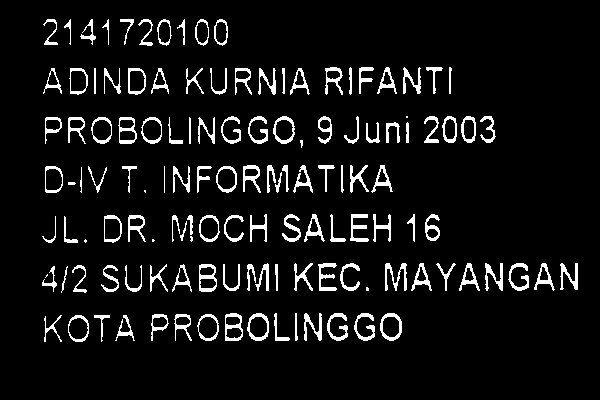

4/4 [==============================] - 0s 27ms/step


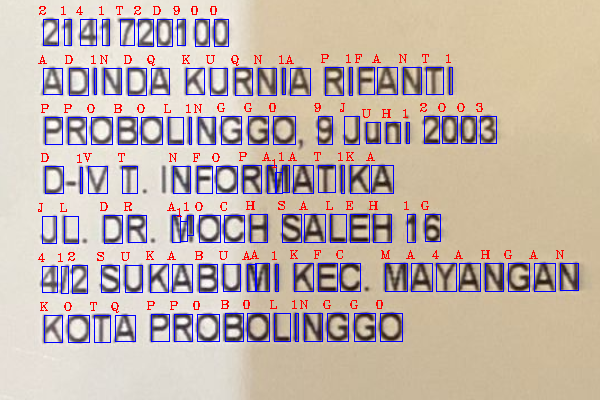

In [ ]:
img_ocr = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/FotoCropHD/ktm_crop_adn1.png')

cv2_imshow(predict(img_ocr))

# **Foto KTM Ryan**

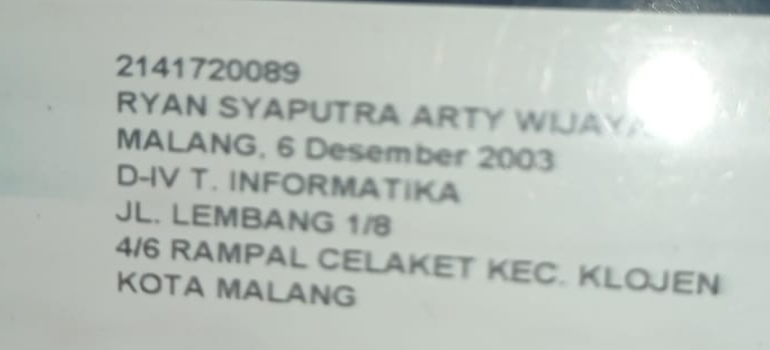

In [ ]:
# Assuming ktm_rgb_miko1 is your original image
new_width, new_height = 1800, 1200

# Resize the image with the new width and height
resized_img_ktm1 = cv2.resize(imgrya2, (new_width, new_height))

# Crop the resized image to the specified region
resized_and_cropped_img = resized_img_ktm1[450:800, 480:1250]

# Path to save the image
save_path_crop = '/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/FotoCropHD'

# Ensure the save directory exists

# Save the image
cv2.imwrite(os.path.join(save_path_crop, 'ktm_crop_rya2.png'), resized_and_cropped_img)

# Show the saved image
cv2_imshow(resized_and_cropped_img)

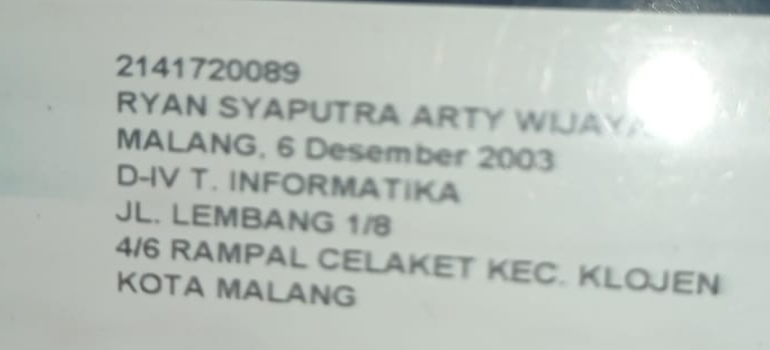

True

In [ ]:
resized_imgrya2 = cv2.resize(imgrya2, (new_width, new_height))
resized_imgktm7 = resized_imgrya2[450:800, 480:1250]
# show image
cv2_imshow(resized_imgktm7)

# Save the image
cv2.imwrite(os.path.join(save_path_crop, 'ktm_crop_rya2.png'), resized_imgktm7)

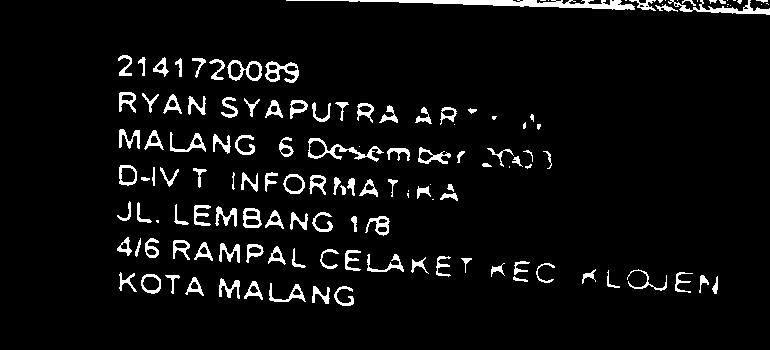

4/4 [==============================] - 0s 9ms/step


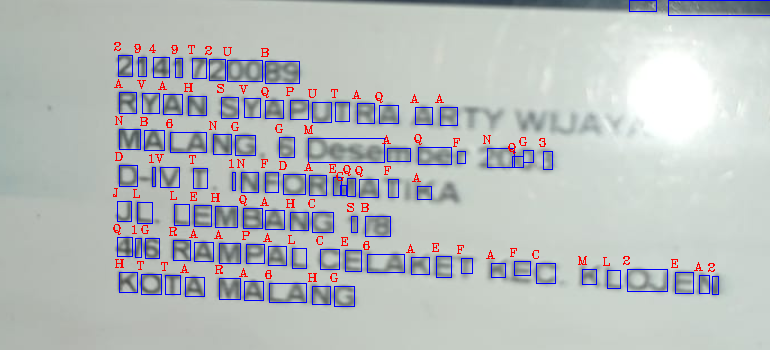

In [ ]:
img_ocr = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/FotoCropHD/ktm_crop_rya2.png')

cv2_imshow(predictss(img_ocr))

# **Foto KTM DWI**

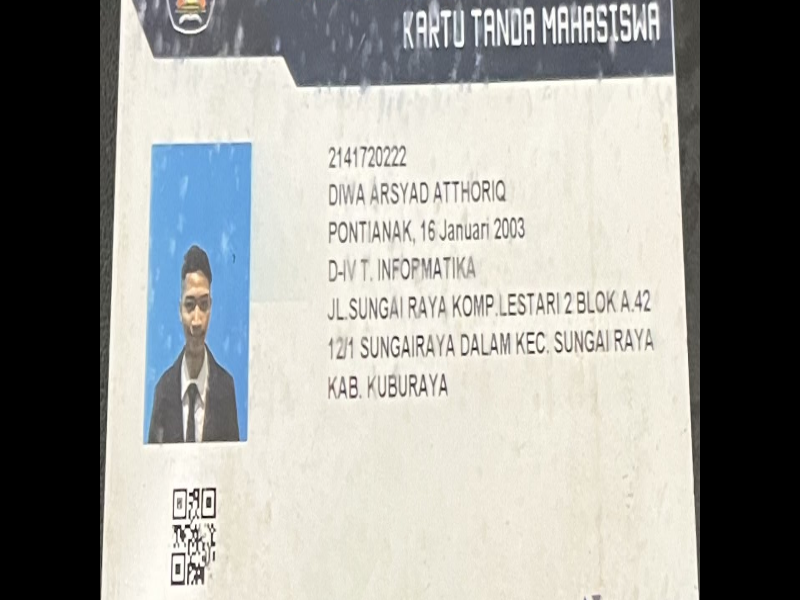

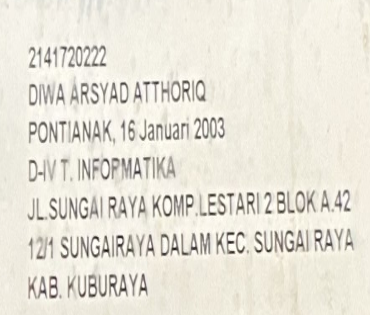

In [ ]:
resized_img_ktm11 =cv2.resize(imgdiw1, (new_width, new_height))

height, width = resized_img_ktm11.shape[:2]
centerX, centerY = (width // 2, height // 2)
M = cv2.getRotationMatrix2D((centerX, centerY), 90, 1.0)
rotated = cv2.warpAffine(resized_img_ktm11, M, (width, height))

# Show the rotated image
cv2_imshow(rotated)

resized_img_ktm11 = rotated[100:415, 300:670]


# Save the image
cv2.imwrite(os.path.join(save_path_crop, 'ktm_crop_diw1.png'), resized_img_ktm11)


# show image
cv2_imshow(resized_img_ktm11)

In [ ]:
def predict_Rotate(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (1,1), 0)
  ret, thresh = cv2.threshold(blur.copy(), 155, 255, cv2.THRESH_TRUNC)
  adaptive = cv2.adaptiveThreshold(thresh, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 1)
  invertion = 255 - adaptive
  erode = cv2.erode(invertion, np.ones((1,1)))
  cv2_imshow(invertion)

  conts = find_contours(erode.copy())

  min_w, max_w = 2, 160
  min_h, max_h = 1, 140
  img_copy = image.copy() # original image for plotting countour result
  detected_char = []

  for c in conts:
    (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
    if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
      roi = gray[y:y+h, x:x+w] # get region of interest for char
      thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
      # cv2_imshow(thresh) # check

      # Build bounding box on original image
      cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)
      (h, w) = thresh.shape
      resized = resize_img(thresh, w, h)
      normalized = normalization(resized)
      detected_char.append((normalized, (x, y, w, h)))


  pixels = np.array([px[0] for px in detected_char], dtype='float32')

  # Get all box for detected char
  boxes = [box[1] for box in detected_char]

  # Predict
  preds = load_network.predict(pixels)

  # Char Prediction
  for p in preds:
    char_idx = np.argmax(p)

  # Show char with actual image
  img_copy2 = image.copy()

  for(pred, (x, y, w, h)) in zip(preds, boxes):
    i = np.argmax(pred)
    char_detected = char_list[i]

    cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 1)
    cv2.putText(img_copy2, char_detected, (x - 5, y - 5), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0,0,255), 1)
  return img_copy2

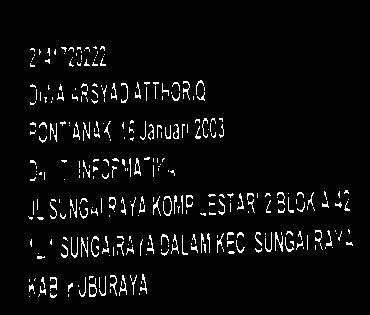

7/7 [==============================] - 0s 19ms/step


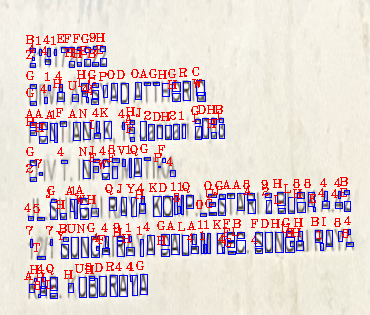

In [ ]:
img1 = cv2.imread('/content/drive/MyDrive/1I Class Informatics Engineering/POLINEMA CLASS TASK/CLASS Semester 5/(PCVK TI) Pengolahan Citra dan Visi Komputer/UAS/FotoCropHD/ktm_crop_diw1.png')

cv2_imshow(predict_Rotate(img1))

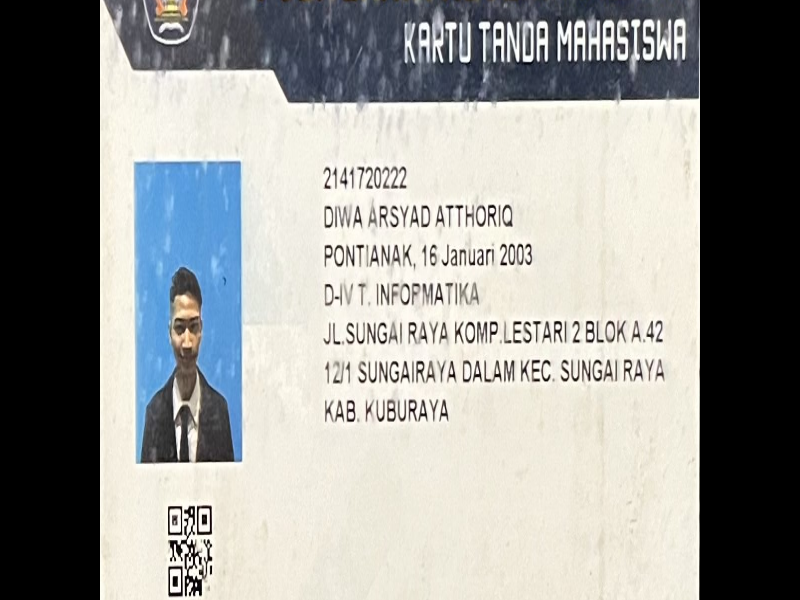

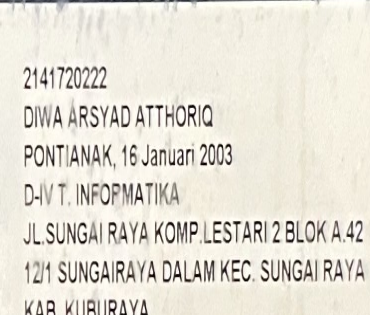

In [ ]:
resized_img_ktm15 =cv2.resize(imgdiw5, (new_width, new_height))

height, width = resized_img_ktm15.shape[:2]
centerX, centerY = (width // 2, height // 2)
M = cv2.getRotationMatrix2D((centerX, centerY), 90, 1.0)
rotated = cv2.warpAffine(resized_img_ktm15, M, (width, height))

# Show the rotated image
cv2_imshow(rotated)

resized_img_ktm15 = rotated[100:415, 300:670]


# Save the image
cv2.imwrite(os.path.join(save_path_crop, 'ktm_crop_diw5.png'), resized_img_ktm15)


# show image
cv2_imshow(resized_img_ktm11)

In [ ]:
def predict_Rotate(image):
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (1,1), 0)
  ret, thresh = cv2.threshold(blur.copy(), 155, 255, cv2.THRESH_TRUNC)
  adaptive = cv2.adaptiveThreshold(thresh, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 1)
  invertion = 255 - adaptive
  erode = cv2.erode(invertion, np.ones((1,1)))
  cv2_imshow(invertion)

  conts = find_contours(erode.copy())

  min_w, max_w = 2, 160
  min_h, max_h = 1, 140
  img_copy = image.copy() # original image for plotting countour result
  detected_char = []

  for c in conts:
    (x, y, w, h) = cv2.boundingRect(c) # find bounding box based on contour
    if(w >= min_w and w <= max_w) and (h >= min_h and h <= max_h): # if pixel follow this rule, it consider as char
      roi = gray[y:y+h, x:x+w] # get region of interest for char
      thresh = cv2.threshold(roi, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
      # cv2_imshow(thresh) # check

      # Build bounding box on original image
      cv2.rectangle(img_copy, (x,y), (x+w, y+h), (255,0,0), 2)
      (h, w) = thresh.shape
      resized = resize_img(thresh, w, h)
      normalized = normalization(resized)
      detected_char.append((normalized, (x, y, w, h)))


  pixels = np.array([px[0] for px in detected_char], dtype='float32')

  # Get all box for detected char
  boxes = [box[1] for box in detected_char]

  # Predict
  preds = load_network.predict(pixels)

  # Char Prediction
  for p in preds:
    char_idx = np.argmax(p)

  # Show char with actual image
  img_copy2 = image.copy()

  for(pred, (x, y, w, h)) in zip(preds, boxes):
    i = np.argmax(pred)
    char_detected = char_list[i]

    cv2.rectangle(img_copy2, (x, y), (x+w, y+h), (255,0,0), 1)
    cv2.putText(img_copy2, char_detected, (x - 5, y - 5), cv2.FONT_HERSHEY_COMPLEX, 0.4, (0,0,255), 1)
  return img_copy2